# Altena 2022 - Clustering
<div class="alert alert-warning">

**What this notebook does**
    
In this notebooke the previously normalized samples will be merged and batch corrected to visualize the full dataset of Altena et. al. Additionally, existing annotation and sample specific prefixes were added. This is the last step within the atlas processing.

### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering')

In [4]:
!ls data

agarwal_base_merge_base.h5ad  smajic_base_merge_base.h5ad
agarwal_merge_base_BC.h5ad    smajic_doublets_merge_base.h5ad
altena_base_merge_base.h5ad   smajic_merge_base_BC.h5ad
altena_merge_base_BC.h5ad     wang_base_merge_base.h5ad
siletti_base_merge_base.h5ad  wang_merge_base_BC.h5ad
siletti_base_merge_BC.h5ad    welch_base_merge_base.h5ad
siletti_merge_base_BC.h5ad    welch_merge_base_BC.h5ad


In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/4_clustering'

In [6]:
path='/home/hers_basak/jjiang/jack/outputs/deliverables/3_normalization/data/processed_'
suffix='base'
atlas='altena'

g004=f'{path}{atlas}_{suffix}_g004.h5ad'
g005=f'{path}{atlas}_{suffix}_g005.h5ad'
g011=f'{path}{atlas}_{suffix}_g011.h5ad'
g012=f'{path}{atlas}_{suffix}_g012.h5ad'
g013=f'{path}{atlas}_{suffix}_g013.h5ad'
g014=f'{path}{atlas}_{suffix}_g014.h5ad'
g015=f'{path}{atlas}_{suffix}_g015.h5ad'
g016=f'{path}{atlas}_{suffix}_g016.h5ad'
g017=f'{path}{atlas}_{suffix}_g017.h5ad'
g018=f'{path}{atlas}_{suffix}_g018.h5ad'
g019=f'{path}{atlas}_{suffix}_g019.h5ad'
g020=f'{path}{atlas}_{suffix}_g020.h5ad'

In [7]:
files = [g004,g005,g011,g012,g013,g014,g015,g016,g017,g018,g019,g020]

In [8]:
names = [name.split('.h5ad')[0].split('processed_')[1] for name in files ]
print(names)

['altena_base_g004', 'altena_base_g005', 'altena_base_g011', 'altena_base_g012', 'altena_base_g013', 'altena_base_g014', 'altena_base_g015', 'altena_base_g016', 'altena_base_g017', 'altena_base_g018', 'altena_base_g019', 'altena_base_g020']


In [9]:
object_names_merged=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_merged.append("adata"+"_"+names[i]+"_"+"preprocessed")
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_altena_base_g004_preprocessed  is loaded
adata_altena_base_g005_preprocessed  is loaded
adata_altena_base_g011_preprocessed  is loaded
adata_altena_base_g012_preprocessed  is loaded
adata_altena_base_g013_preprocessed  is loaded
adata_altena_base_g014_preprocessed  is loaded
adata_altena_base_g015_preprocessed  is loaded
adata_altena_base_g016_preprocessed  is loaded
adata_altena_base_g017_preprocessed  is loaded
adata_altena_base_g018_preprocessed  is loaded
adata_altena_base_g019_preprocessed  is loaded
adata_altena_base_g020_preprocessed  is loaded


In [ ]:
suffix =['-0','-1','-2','-3','-4','-5','-6','-7','-8','-9','-10','-11']
for i in range(numberobj):
    locals()[object_names_merged[i]].obs_names= [name + suffix[i] if name[-1]=='1' else name for name in locals()[object_names_merged[i]].obs_names ]

## Merge
Observation suffixes are sample specific, so to match the older atlas annotation we match there suffixes.

In [ ]:
old='/hpc/hers_basak/rnaseq_data/Hollab/Anna/scRNAseq_analysis/10x_VTA/VTA_human_cellbender/data/human_VTA_TACTICs.h5ad'
locals()['old'] = sc.read(old) 
print('old h5ad file is loaded')

In [ ]:
old.obs['individual']

In [ ]:
adata_altena_merge=ad.concat([adata_altena_base_g004_preprocessed, adata_altena_base_g005_preprocessed, adata_altena_base_g011_preprocessed, adata_altena_base_g012_preprocessed, adata_altena_base_g013_preprocessed, adata_altena_base_g014_preprocessed, adata_altena_base_g015_preprocessed, adata_altena_base_g016_preprocessed, adata_altena_base_g017_preprocessed, adata_altena_base_g018_preprocessed, adata_altena_base_g019_preprocessed, adata_altena_base_g020_preprocessed],  join="outer", fill_value=0)


In [ ]:
adata_altena_merge.obs_names

In [ ]:
original_cellclass_lvl1 =list()
original_subclass_lvl3_1 =list()
original_cellclass_lvl1_n =list()
original_lineage =list()
original_subclass_lvl2 =list()
original_celltype_lvl3 =list()

annotation=[original_cellclass_lvl1,original_subclass_lvl3_1,original_cellclass_lvl1_n,original_lineage,original_subclass_lvl2,original_celltype_lvl3]
annotation_names=['original_cellclass_lvl1','original_subclass_lvl3_1','original_cellclass_lvl1_n','original_lineage','original_subclass_lvl2','original_celltype_lvl3']
annotation_names_og=['cellclass_lvl1','subclass_lvl3_1','cellclass_lvl1_n','lineage','subclass_lvl2','celltype_lvl3']


for i in range(len(annotation)):
    except_counter=0
    for obs_name in adata_altena_merge.obs_names:
        try:
            annotation[i].append(old.obs[annotation_names_og[i]][obs_name])
        except:
            except_counter+=1
            annotation[i].append('None')
    print(except_counter)
    


In [ ]:
set(original_cellclass_lvl1)

In [ ]:
for i in range(len(annotation)):
    adata_altena_merge.obs[annotation_names[i]]= annotation[i]

In [ ]:
adata_altena_merge.write(os.path.join('./data/altena_base_merge_base.h5ad'))


In [ ]:
object_names_merged = ['adata_altena_merge']
names = ['altena_merge']
numberobj=1

In [ ]:
print(adata_altena_merge.obs[adata_altena_merge.obs['donor']=='6'])

## All data

pca again

In [10]:
object_names_merged = ['adata_merge']
names = ['altena_merge']
path='/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering/data'
files=[f'{path}/altena_base_merge_base.h5ad']

numberobj=1
for i in range(numberobj):
    locals()[object_names_merged[i]] = sc.read(files[i]) 
    print(object_names_merged[i],' is loaded')

adata_merge  is loaded


In [12]:
sc.pp.highly_variable_genes(
    adata_merge,
    n_top_genes=5000,
    batch_key="atlas",
    subset=True)

In [13]:
adata_merge

AnnData object with n_obs × n_vars = 85044 × 5000
    obs: 'species', 'atlas', 'sample', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'original_cellclass_lvl1', 'original_subclass_lvl3_1', 'original_cellclass_lvl1_n', 'original_lineage', 'original_subclass_lvl2', 'original_celltype_lvl3', 'donor'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'hvg'
    obsm: 'X_pca', 'X_umap'

In [18]:
# MAP2 en SNAP25
for i in adata_merge.var_names:
    if i =='SNAP25':
        print('1')

1


In [7]:
suffixes=list()
for i in adata_merge.obs_names:
    suffixes.append(i[-2:].replace('-',''))
    
donor = list()
for i in suffixes:
    if i in ['0','1','2']:
        donor.append('1')
    elif i in ['3','4','5']:
        donor.append('2')
    elif i in ['6']:
        donor.append('3')
    elif i in ['7']:
        donor.append('4')
    elif i in ['8']:
        donor.append('5')
    elif i in ['9','10','11']:
        donor.append('6')
        

In [8]:
adata_merge.obs['donor']=donor

In [9]:
adata_merge.obs['donor']

AATCACGCAACTGTGT-1-0     1
ACTTATCTCGATACGT-1-0     1
CTACATTGTTAAACCC-1-0     1
TTAGGGTTCTTGCGCT-1-0     1
AAGCCATGTATCGTTG-1-0     1
                        ..
TTCTTGAGTATTCCGA-1-11    6
TGGAGAGCAAGCGCAA-1-11    6
ATCACAGAGAATCTAG-1-11    6
ACTTCCGCAGAATTCC-1-11    6
GTACAGTGTGGTCCGT-1-11    6
Name: donor, Length: 85044, dtype: object

In [10]:
#To make reproducible plots
np.random.seed(41)

In [ ]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged[i]], svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

altena_merge


In [ ]:
nn= 15 #default 15
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged[i]], n_neighbors=nn, n_pcs=40)
    sc.tl.umap(locals()[object_names_merged[i]])

altena_merge


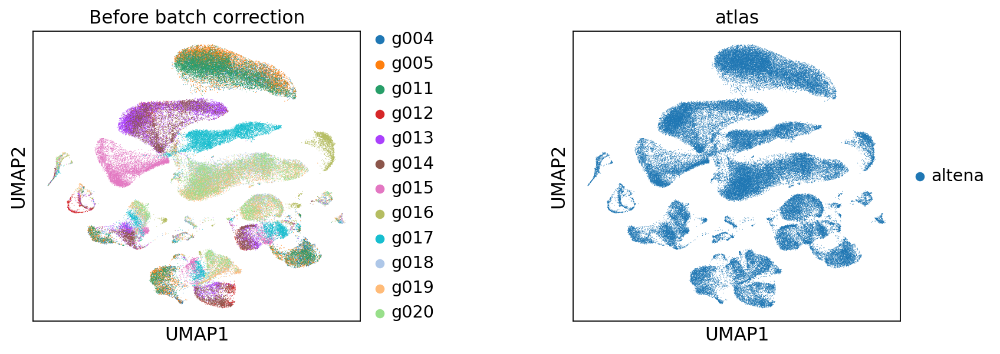

In [13]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged[i]],color=['sample', 'atlas'], wspace=0.5,s=1, title='Before batch correction')

altena_merge


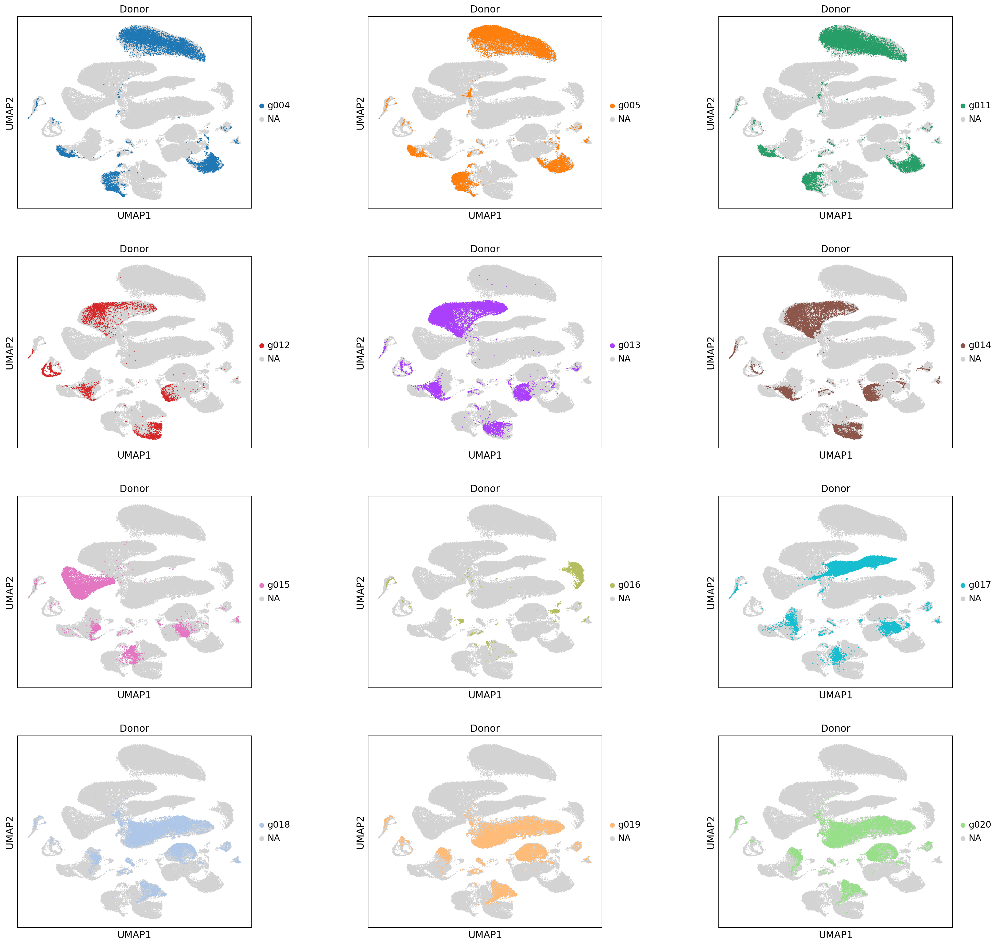

In [14]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(4, 3, figsize = [24,24])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g004', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g005', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g011', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g012', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g013', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g014', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g015', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g016', use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g017', use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g018', use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g019', use_raw=False, s=10, ax= axs[3,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged[i]], color=feature1, groups= 'g020', use_raw=False, s=10, ax= axs[3,2],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_subplots.png',bbox_inches='tight')

altena_merge


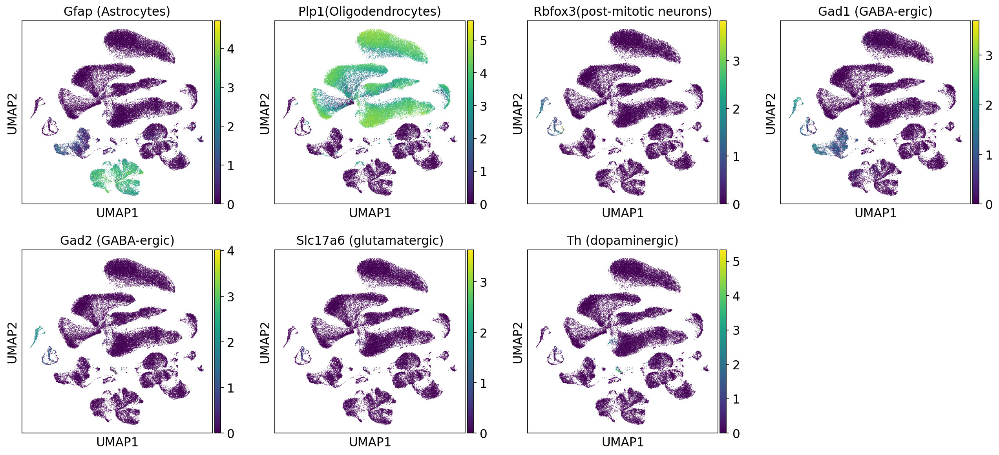

In [15]:
for i in range(numberobj):
    print(names[i])
    if locals()[object_names_merged[i]].obs['species'][0] == 'Homo sapien':
        sc.pl.umap(locals()[object_names_merged[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'SLC17A6','TH'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=1, save=f'/{names[i]}_subplots_markers.png')
    else:
        sc.pl.umap(locals()[object_names_merged[i]], color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [11]:
object_names_merged_BC=list()

for i in range(numberobj):
    object_names_merged_BC.append("adata"+"_"+names[i]+"_"+"full_BC")
    locals()[object_names_merged_BC[i]] = locals()[object_names_merged[i]].copy()
    print(object_names_merged_BC[i],' is loaded')

adata_altena_merge_full_BC  is loaded


In [12]:
for i in range(numberobj):
    print(names[i])
    sc.tl.pca(locals()[object_names_merged_BC[i]], svd_solver='arpack')

altena_merge


In [13]:
for i in range(numberobj):
    print(names[i])
    sc.external.pp.harmony_integrate(locals()[object_names_merged_BC[i]], key =['donor'])

altena_merge


2023-10-01 12:25:05,514 - harmonypy - INFO - Iteration 1 of 10
2023-10-01 12:25:50,888 - harmonypy - INFO - Iteration 2 of 10
2023-10-01 12:26:35,267 - harmonypy - INFO - Iteration 3 of 10
2023-10-01 12:27:20,343 - harmonypy - INFO - Iteration 4 of 10
2023-10-01 12:27:54,959 - harmonypy - INFO - Iteration 5 of 10
2023-10-01 12:28:15,793 - harmonypy - INFO - Converged after 5 iterations


altena_merge


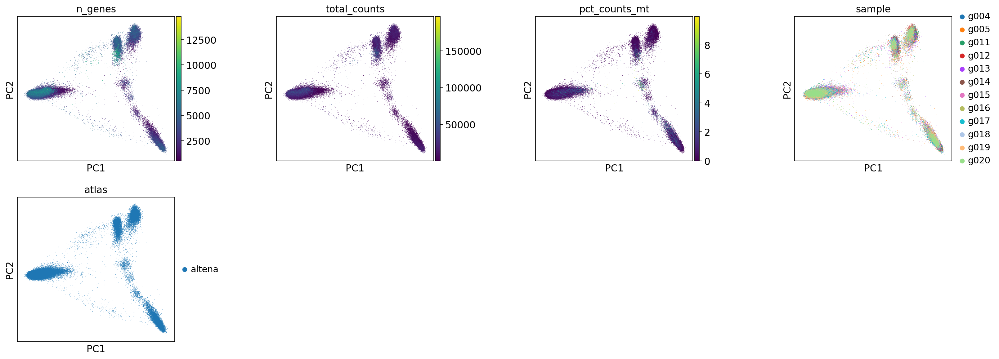

In [19]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]], color=['n_genes', 'total_counts', 'pct_counts_mt', 'sample', 'atlas'],wspace=0.5)


altena_merge


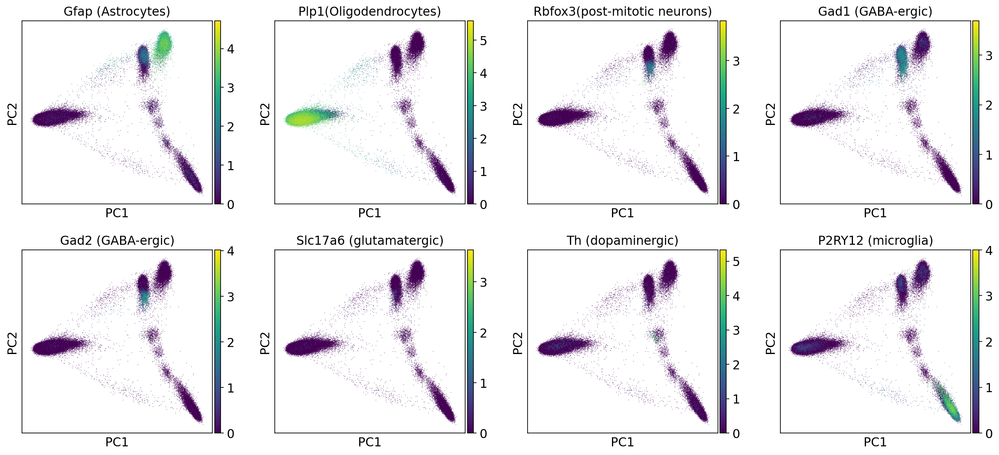

In [20]:
for i in range(numberobj):
    print(names[i])
    sc.pl.pca(locals()[object_names_merged_BC[i]],use_raw=False, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

In [14]:
nn=40
for i in range(numberobj):
    print(names[i])
    sc.pp.neighbors(locals()[object_names_merged_BC[i]], n_neighbors=nn, n_pcs=50,use_rep='X_pca_harmony')
    sc.tl.umap(locals()[object_names_merged_BC[i]])
    

altena_merge


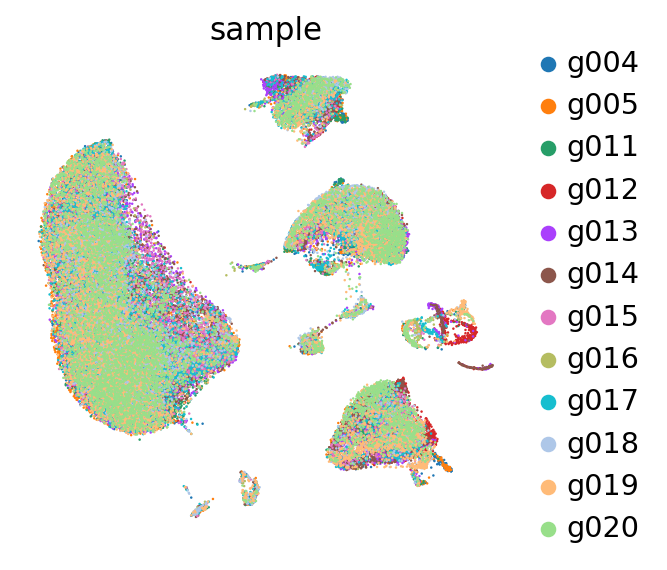

In [16]:
sc.settings.figdir = '/home/hers_basak/jjiang/jack/outputs/deliverables/4_clustering/figures/'

sc.pl.umap(locals()[object_names_merged_BC[i]], color=['sample'], show=False,frameon=False,
               use_raw=False, s=5, wspace=0.5)
plt.savefig(f"./altena_merge_BC_sample.png", bbox_inches="tight")

altena_merge


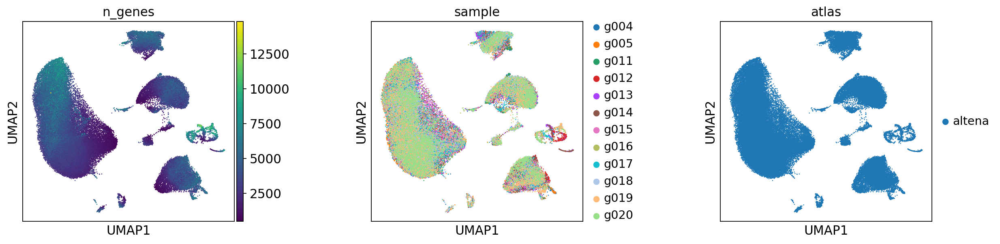

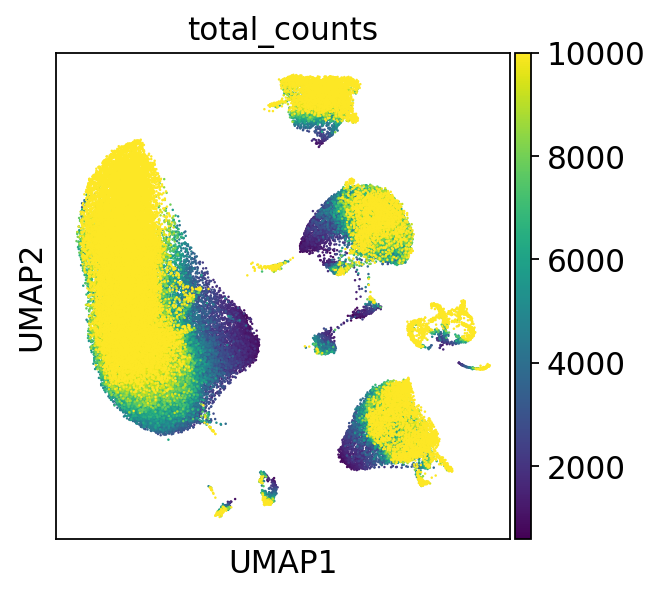

In [22]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['n_genes','sample', 'atlas'], 
               use_raw=False, s=5, wspace=0.5)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='total_counts', vmax=10000,
               use_raw=False, s=5, wspace=0.5)
    

altena_merge


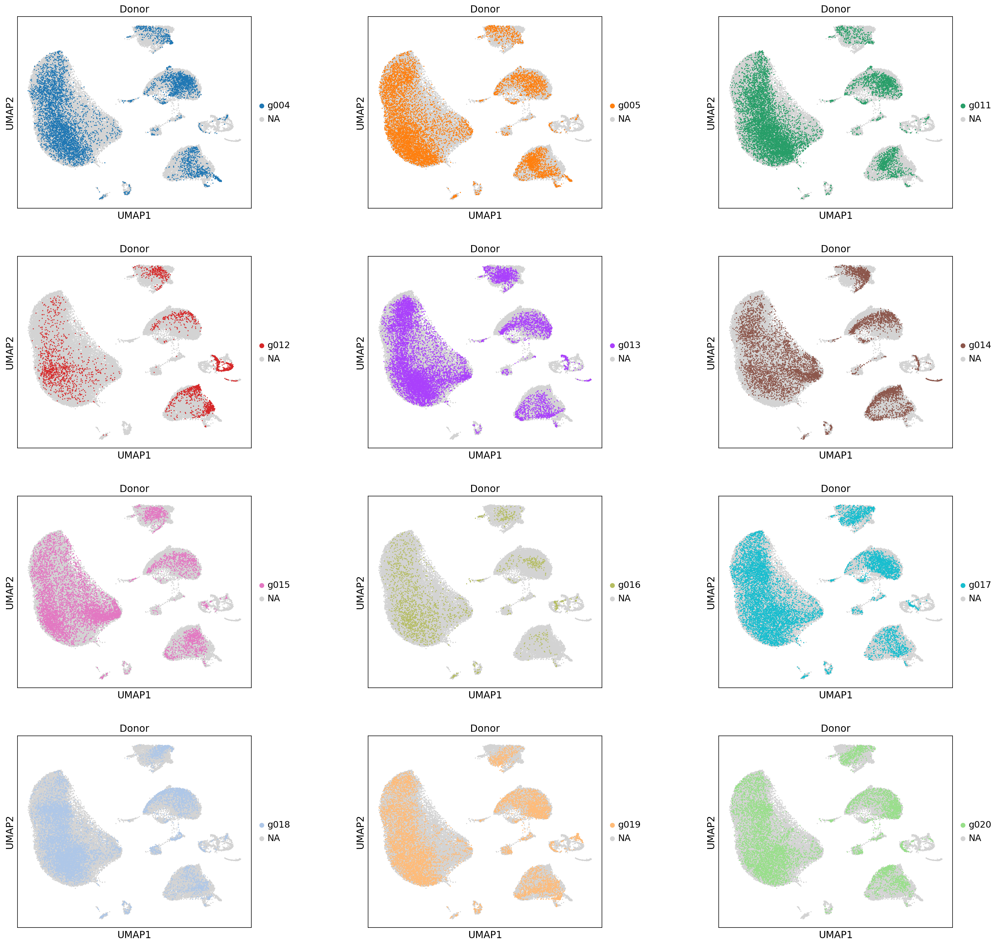

In [23]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(4, 3, figsize = [24,24])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g004', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g005', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g011', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g012', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g013', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g014', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g015', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g016', use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g017', use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g018', use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g019', use_raw=False, s=10, ax= axs[3,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g020', use_raw=False, s=10, ax= axs[3,2],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_BC_subplots.png',bbox_inches='tight')

altena_merge


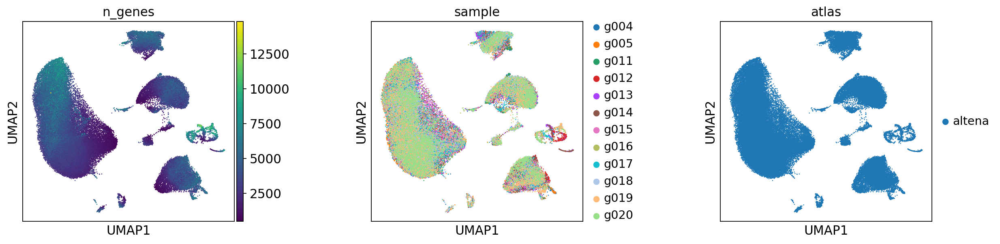

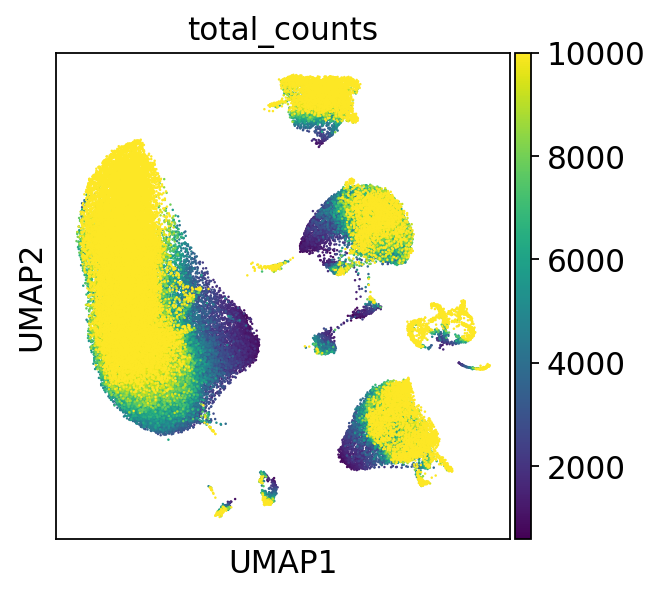

In [24]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['n_genes','sample', 'atlas'], 
               use_raw=False, s=5, wspace=0.5)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='total_counts', vmax=10000,
               use_raw=False, s=5, wspace=0.5)
    

altena_merge


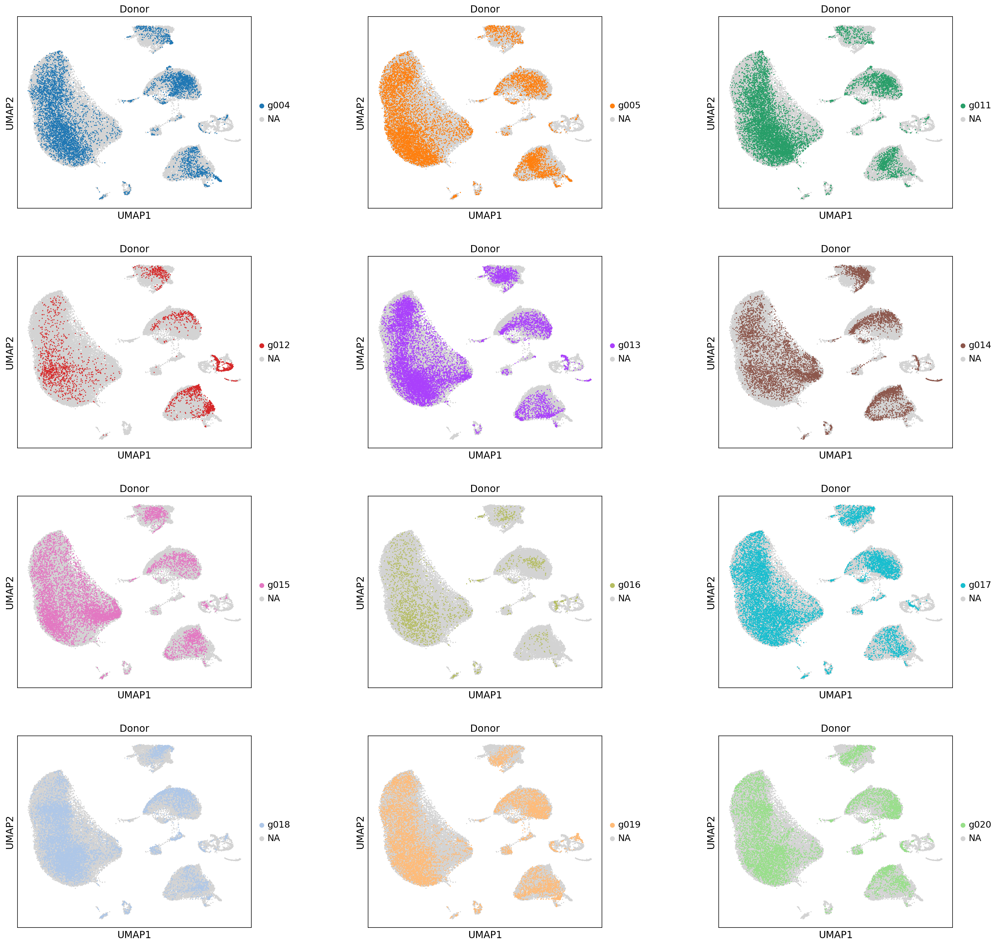

In [25]:
feature1='sample'
title1='Donor'
for i in range(numberobj):
    print(names[i])
    fig, axs = plt.subplots(4, 3, figsize = [24,24])
    #axs[-1, -1].axis('off')
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g004', use_raw=False, s=10, ax= axs[0,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g005', use_raw=False, s=10, ax= axs[0,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g011', use_raw=False, s=10, ax= axs[0,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g012', use_raw=False, s=10, ax= axs[1,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g013', use_raw=False, s=10, ax= axs[1,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g014', use_raw=False, s=10, ax= axs[1,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g015', use_raw=False, s=10, ax= axs[2,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g016', use_raw=False, s=10, ax= axs[2,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g017', use_raw=False, s=10, ax= axs[2,2],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g018', use_raw=False, s=10, ax= axs[3,0],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g019', use_raw=False, s=10, ax= axs[3,1],show=False, title=title1)
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=feature1, groups= 'g020', use_raw=False, s=10, ax= axs[3,2],show=False, title=title1)
    fig.savefig(f'figures/{names[i]}_BC_subplots.png',bbox_inches='tight')

altena_merge


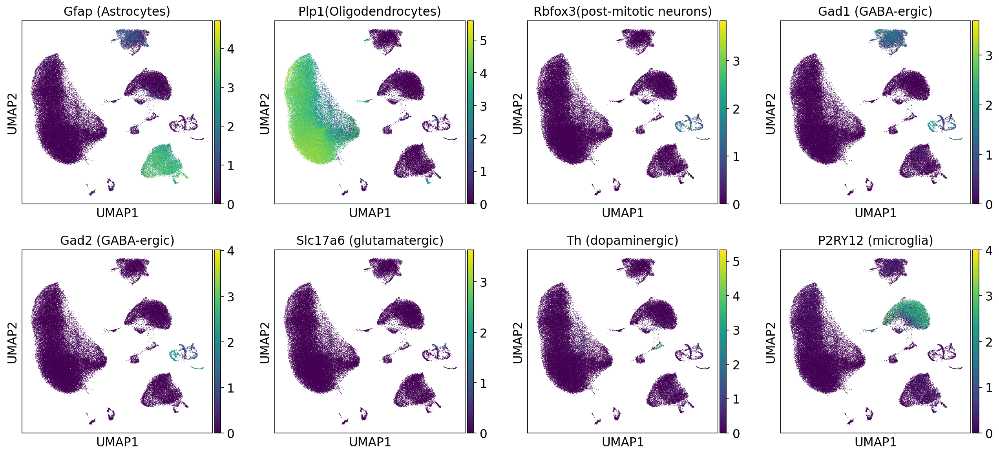

In [26]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','P2RY12' ],use_raw=False,title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (glutamatergic)', 'Th (dopaminergic)','P2RY12 (microglia)'])

In [1]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color=['MOBP','AQP4', 'CD74' ],use_raw=False,title=['MOBP (oligodendrocytes)','AQP4 (astrocytes)','CD74(microglia)'])

NameError: name 'numberobj' is not defined

In [28]:
adata_altena_merge_full_BC.write(os.path.join('./data/altena_merge_base_BC.h5ad'))


In [ ]:
locals()[object_names_merged_BC[i]]

In [ ]:
for i in range(numberobj):
    print(names[i])
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='original_cellclass_lvl1', 
               use_raw=False, s=5, wspace=0.5, save='/altena_og_celltype.png')
    sc.pl.umap(locals()[object_names_merged_BC[i]], color='sample', 
               use_raw=False, s=5, wspace=0.5, save='/altena_sample.png')

In [ ]:
for i in range(numberobj):
    mean_counts_high = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] =='None']['total_counts']))
    mean_genes_high = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] =='None']['n_genes']))
    mean_counts = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] !='None']['total_counts']))
    mean_genes = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] !='None']['n_genes']))
    
    
    filtered_cells = [mean_counts_high,mean_genes_high]
    all_cells = [mean_counts,mean_genes]
    index = ['counts (no mt)', 'genes']
    
    
    df = pd.DataFrame({f'unknown cells': filtered_cells, 'known cells': all_cells}, index=index)
    
    ax = df.plot.bar(rot=0,title=names[i])

In [ ]:
for i in range(numberobj):
    mean_counts_high = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] =='None']['total_counts']))
    mean_genes_high = float(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] =='None']['doublet_score']))
    mean_counts = int(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] !='None']['total_counts']))
    mean_genes = float(np.mean(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] !='None']['doublet_score']))
    
    dis_high = pd.Series(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] =='None']['doublet_score'].tolist())
    dis = pd.Series(locals()[object_names_merged_BC[i]].obs[locals()[object_names_merged_BC[i]].obs['original_cellclass_lvl1'] !='None']['doublet_score'].tolist())
    
    filtered_cells = [dis_high]
    all_cells = [dis]
    index = ['doublet_score']
    
    
    df = pd.DataFrame({f'unknown': dis_high})
    df2 = pd.DataFrame({f'known': dis})

    plt.boxplot([df['unknown'],df2['known']], labels=['unknown','known'])
    plt.title(names[i])
    plt.ylabel('Values')
    plt.show()

In [ ]:
df2.values[0]

In [ ]:
locals()[object_names_merged_BC[i]].obs['doublet_score']